<a href="https://colab.research.google.com/github/ruiguo-bio/colab_tension_vae/blob/main/tension_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Music generation with controlled tension





## install packages

In [1]:
!apt install musescore fluidsynth
!pip install music21 pyFluidSynth
!pip install pretty_midi

!git clone https://github.com/ruiguo-bio/colab_tension_vae.git

E: Could not open lock file /var/lib/dpkg/lock-frontend - open (13: Permission denied)
E: Unable to acquire the dpkg frontend lock (/var/lib/dpkg/lock-frontend), are you root?
You should consider upgrading via the '/home/urania/PycharmProjects/pythonProject/probanding/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/home/urania/PycharmProjects/pythonProject/probanding/bin/python -m pip install --upgrade pip' command.
Cloning into 'colab_tension_vae'...
remote: Enumerating objects: 84, done.
remote: Counting objects: 100% (84/84), done.
remote: Compressing objects: 100% (72/72), done.
remote: Total 84 (delta 33), reused 46 (delta 11), pack-reused 0
Unpacking objects: 100% (84/84), 58.11 MiB | 5.02 MiB/s, done.


In [4]:
! cd colab_tension_vae/

In [5]:
import build_model
import util
from preprocess_midi import *

import pickle
import IPython.display as ipd
import os
import pretty_midi
import numpy as np
from google.colab import files

2021-08-02 15:38:17.052156: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2021-08-02 15:38:17.052233: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [6]:
util.setup_musescore()

## Load model and tension feature vectors

In [7]:
model = build_model.build_model()

2021-08-02 15:38:38.828576: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-08-02 15:38:38.829483: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2021-08-02 15:38:38.829511: W tensorflow/stream_executor/cuda/cuda_driver.cc:326] failed call to cuInit: UNKNOWN ERROR (303)
2021-08-02 15:38:38.829538: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Helicon): /proc/driver/nvidia/version does not exist
2021-08-02 15:38:38.830268: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropr

In [8]:
model.load_weights('model/vae.h5')

ValueError: Layer #1 (named "decoder" in the current model) was found to correspond to layer decoder in the save file. However the new layer decoder expects 22 weights, but the saved weights have 30 elements.

In [7]:


# def four_bar_iterate(pianoroll, model, feature_vectors,
#                       factor_t,
#                       factor_d,
#                      first_up=True):

#     number_of_iteration = pianoroll.shape[0] // 128
#     result_roll = None
#     tensile_strain = None
#     diameter = None
    
#     for i in range(number_of_iteration):
        
#         random_selection = np.random.randint(0,len(feature_vectors))
#         feature_vector = feature_vectors[random_selection]
#         # print(f'feature vector number is {random_selection}')
#         if np.array_equal(feature_vector,tensile_up_feature_vector) or np.array_equal(feature_vector,tensile_up_down_feature_vector) or np.array_equal(feature_vector,tensile_high_feature_vector):
#             factor = factor_t
#             print('tensile change')
#         else:
#             factor = factor_d
#             print('diameter')

#         for j in range(2):
            
#             first_4_bar = 0 if j == 0 else 1 
#             direction = 1 if j == 0 else -1
#             direction = -1*direction if first_up is False else direction
#             start_time_step = 128*i+64*first_4_bar
#             print(f'number_of_iteration is {i}')
#             # print(f'start_time_step is {start_time_step}')
#             # print(f'j is {j}')
#             input_roll = np.expand_dims(pianoroll[start_time_step:start_time_step+64,:],0)
#             # print(f'input shape is {input_roll.shape}')
#             z = model.layers[1].predict(input_roll)
#             curr_factor = direction * (np.random.uniform(-1,1) + factor)
#             print(f'factor is {curr_factor}')
#             z_new = z + curr_factor * feature_vector
#             reconstruction_new = model.layers[2].predict(z_new)
#             result_new = util.result_sampling(np.concatenate(list(reconstruction_new), axis=-1))[0]
#             tensile_new = np.squeeze(reconstruction_new[-2])
#             diameter_new = np.squeeze(reconstruction_new[-1])

#             if result_roll is None:
#                 result_roll = result_new
#                 tensile_strain = tensile_new
#                 diameter = diameter_new
#             else:
#                 result_roll = np.vstack([result_roll,result_new])
#                 tensile_strain = np.concatenate([tensile_strain,tensile_new])
#                 diameter = np.concatenate([diameter,diameter_new])

#             # print(f'result roll shape is {result_roll.shape}')
#             # print(f'tensile_strain shape is {tensile_strain.shape}')
#             # print(f'diameter shape is {diameter.shape}')
#             # print('\n')
    
  
#     start_time_step = 128*(i+1)
#     result_roll = np.vstack([result_roll,pianoroll[start_time_step:,:]])


#     return result_roll, tensile_strain, diameter

    


## select midi file

In [11]:

#@title # choose a midi file
#@markdown You can choose one of the examples provided here or upload your own midi file. If you upload your own file please make sure that the first track is melody and second track is bass, and the midi should be in C major or A minor.


# def upload_midi():
#     data = files.upload()
#     if len(list(data.keys())) > 1:
#         print('Multiple files uploaded; using only one.')
#
#     return list(data.keys())[0]


melody = 'example4'  #@param ['example1','example2', 'example3','example4','Upload your midi']

# if melody == 'Upload your midi':
#     melody_file = upload_midi()
if melody == 'example1':
    melody_file = 'data/041ea9c1df8b4163256c8a8a3ffb04dd.mid'
elif melody == 'example2':
    melody_file = 'data/631133fa2ae7095bb9113087af86744e.mid'
elif melody == 'example3':
    melody_file = 'data/d0264d60827aa635c5bdf44627f4577a.mid'
elif melody == 'example4':
    melody_file = 'data/crying_sand.mid'
else:
    melody_file = 'data/e6a4afe05f022c891bfe081d4be261db.mid'







  


## show the score and play 

In [ ]:
piano_roll, bar_indices,pm_old = preprocess_midi(melody_file)
piano_roll_new = np.reshape(piano_roll,(-1,piano_roll.shape[-1]))
pm_new = util.roll_to_pretty_midi(piano_roll_new,pm_old)

In [59]:
# the original file music
ipd.Audio(pm_old.fluidsynth(fs=16000), rate=16000)

In [60]:
# the filtered new file music
# it concatenates 4 bar sections with both melody and bass tracks
ipd.Audio(pm_new.fluidsynth(fs=16000), rate=16000)

The new file score has only the first a few bars are showed here.
For full score please download midi files and use other program to view

In [ ]:
# the new file score
# only the first a few bars are showed here
# for full score please download midi files and use other program to view
util.show_score(pm_new)
pm_new.write('./filtered_4bar_concat.mid')
files.download('./filtered_4bar_concat.mid')

# tension manipulation

## apply tension change iteratively to all the song

In [61]:
#@title select the tension manipulations included

#@markdown the manipulations selected will be randomly applied to every 8 bars
#@markdown 



tensile_strain_direction = "yes" #@param ["yes", "no"]
diameter_direction = "no" #@param ["yes", "no"] {type:"string"}

tensile_strain_level = "no" #@param ["yes", "no"]
diameter_level = "yes" #@param ["yes", "no"]

tensile_strain_up_down = "yes" #@param ["yes", "no"]

#@markdown select first 4 bar tension change factor sign for every 8 bar

first_change = "positive" #@param ["positive", "negative"]

#@markdown select the tension strain change factor
tensile_strain_factor = 6 #@param {type:"slider", min:1, max:7, step:0.5}

#@markdown select the diameter change factor
diameter_factor = 3.5 #@param {type:"slider", min:0.5, max:4, step:0.5}


feature_vectors = []


if tensile_strain_direction == 'yes':
    feature_vectors.append(tensile_up_feature_vector)

if diameter_direction == 'yes':
    feature_vectors.append(diameter_up_feature_vector)

if tensile_strain_level == 'yes':
    feature_vectors.append(tensile_high_feature_vector)

if diameter_level == 'yes':
    feature_vectors.append(diameter_high_feature_vector)

if tensile_strain_up_down == 'yes':
    feature_vectors.append(tensile_up_down_feature_vector)







Run this to apply tension change to the seleted bars

In [62]:
result_roll, tensile_strain, diameter = four_bar_iterate(piano_roll_new,model,
                                                          feature_vectors,
                                                         tensile_strain_factor,
                                                         diameter_factor,
                                                         first_change)

tensile change
number_of_iteration is 0
factor is 5.7893874136945005
number_of_iteration is 0
factor is -5.645102897121718
tensile change
number_of_iteration is 1
factor is 6.599176162446874
number_of_iteration is 1
factor is -5.4419129714709
tensile change
number_of_iteration is 2
factor is 6.8818304914558395
number_of_iteration is 2
factor is -6.493710351990395


changed music

In [63]:

# pm_new = util.roll_to_pretty_midi(piano_roll_new,pm_old)
# print('original score')
# util.show_score(pm_new)
pm_result = util.roll_to_pretty_midi(result_roll,pm_old)
ipd.Audio(pm_result.fluidsynth(fs=16000), rate=16000)



changed score

In [ ]:
print('new score')
util.show_score(pm_result)

In [ ]:
# the changed music
pm_result.write('./all_changed.mid')
files.download('./all_changed.mid')



## change the tension to selected bars(4 or 8 bar)

In [64]:
#@title Please select start and end bar
#@markdown the selected bar length should be 4 bar or 8 bar

start_section = 9 #@param {type:"integer"}
end_section = 17 #@param {type:"integer"}



In [65]:
#@title select the tension manipulation
#@markdown first 4 bar


tensile_strain_direction1 = False #@param ["False", "True"] {type:"raw"}
tensile_strain_factor1 = 5.5 #@param {type:"slider", min:-8, max:8, step:0.5}

diameter_level1 = True #@param ["False", "True"] {type:"raw"}
diameter_factor1 = 4 #@param {type:"slider", min:-4, max:4, step:0.5}

#@markdown second 4 bar (optional)

tensile_strain_direction2 = True #@param ["False", "True"] {type:"raw"}
tensile_strain_factor2 = -6 #@param {type:"slider", min:-8, max:8, step:0.5}

diameter_level2 = False #@param ["False", "True"] {type:"raw"}
diameter_factor2 = -4 #@param {type:"slider", min:-4, max:4, step:0.5}



run this to apply tension change

first four bar tension


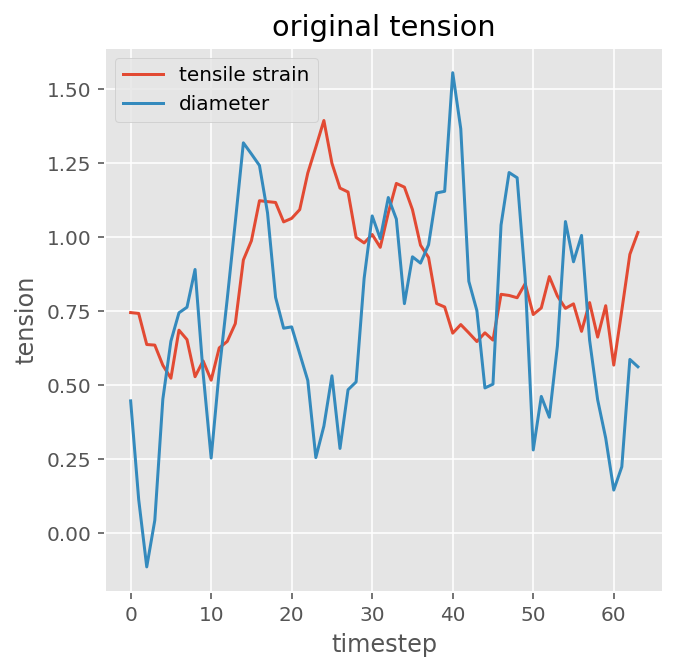

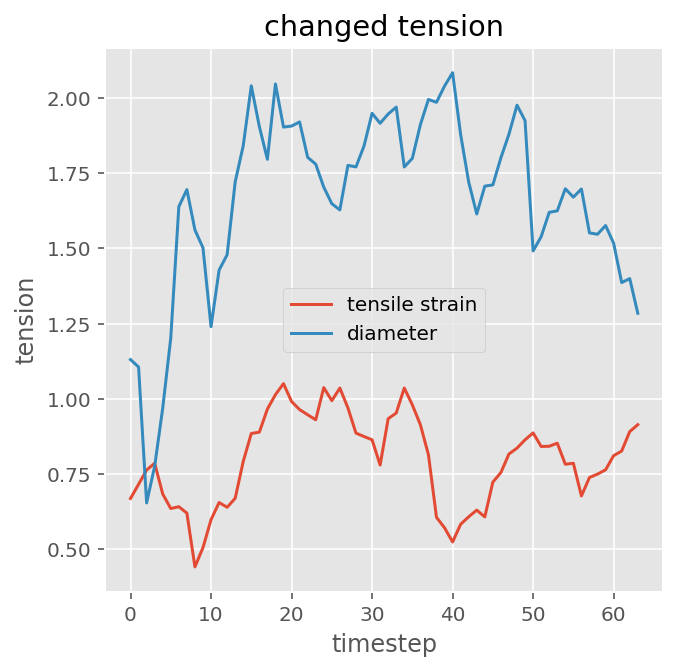

second four bar tension


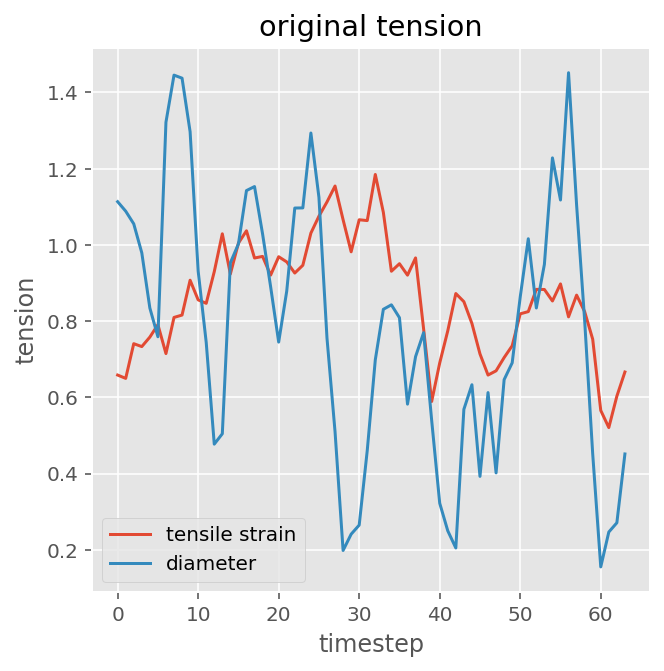

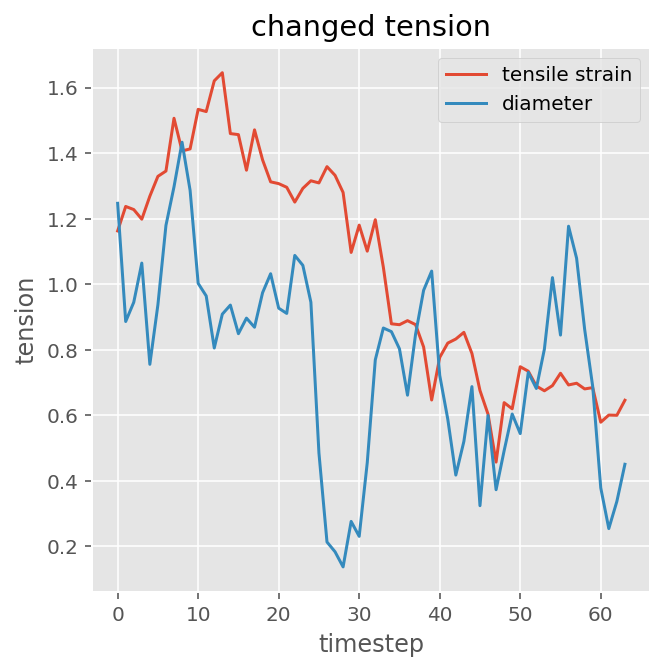

In [66]:

selected_roll1 = piano_roll_new[16*(start_section-1):16*(start_section + 4-1)]
print('first four bar tension')
_,result_roll1 = build_model.manipulate_latent_space(selected_roll1,tensile_up_feature_vector,
                                    diameter_high_feature_vector,
                                    tensile_up_down_feature_vector,
                                    model,tensile_strain_factor1,
                                    diameter_factor1,0,
                                    tensile_strain_direction1,diameter_level1,False,
                                    True,True)



if end_section-start_section>4:
    selected_roll2 = piano_roll_new[16*(start_section + 3):16*(end_section-1)]
    print('second four bar tension')
    _,result_roll2 = build_model.manipulate_latent_space(selected_roll2,tensile_up_feature_vector,
                                    diameter_high_feature_vector,
                                    tensile_up_down_feature_vector,
                                    model,tensile_strain_factor2,
                                    diameter_factor2,0,
                                    tensile_strain_direction2,diameter_level2,False,
                                    True,True)


    result_roll = np.vstack([result_roll1,result_roll2])
    original_roll = piano_roll_new[16*(start_section-1):16*(end_section-1)]
else:
    result_roll = result_roll1
    original_roll = selected_roll1



pm_original = util.roll_to_pretty_midi(original_roll,pm_old)
pm_new = util.roll_to_pretty_midi(result_roll,pm_old)


changed music

In [67]:
ipd.Audio(pm_new.fluidsynth(fs=16000), rate=16000)

original music

In [68]:
ipd.Audio(pm_original.fluidsynth(fs=16000), rate=16000)



show score

In [ ]:
print('original score')
util.show_score(pm_original)
print('new score')
util.show_score(pm_new)